In [3]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from mlrose.opt_probs import TSPOpt, DiscreteOpt
from mlrose.fitness import TravellingSales, FlipFlop, FourPeaks
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import mlrose
from sklearn.metrics import log_loss, classification_report


In [4]:
def load_dataset(file):
    df = pd.read_csv(file)
    df['deposit'] = LabelEncoder().fit_transform(df['deposit'])
    cat_col = ['job','marital','education','default','housing','loan','contact','day','month','poutcome']
    df_matrix = df.copy()
    for col in cat_col:
        df_cat = df[col]
        df_cat_dummy = pd.get_dummies(df_cat,drop_first=True, prefix=col)
        df_matrix.drop(col,axis=1,inplace=True)
        df_matrix = pd.concat([df_matrix,df_cat_dummy],axis=1)
    num_col = ['age','balance','duration','pdays','previous','campaign']
    for col in num_col:
        df_col = df[col]
        df_matrix[col] = (df_col-df_col.min())/(df_col.max()-df_col.min())
    df_Y = df_matrix['deposit']
    df_X = df_matrix.drop('deposit',axis = 1)
    X_train, X_test, y_train, y_test = train_test_split(df_X, df_Y, test_size=0.33, random_state=42)
    return X_train, X_test, y_train, y_test

In [5]:
x_train, x_test, y_train, y_test = load_dataset('bank.csv')

In [27]:
rhc_nn = mlrose.NeuralNetwork(hidden_nodes=[16, 16], activation='relu',
                        algorithm='random_hill_climb', max_iters=50000,
                        bias=True, is_classifier=True, learning_rate=0.01,
                        early_stopping=False,max_attempts=50000, random_state=10, curve=True)

In [28]:
rhc_nn.fit(x_train, y_train)

NeuralNetwork(hidden_nodes=[16, 16], learning_rate=0.01, max_iters=50000)

In [29]:
print('RHC training classification report = \n {}'.format(classification_report(y_train, rhc_nn.predict(x_train))))

RHC training classification report = 
               precision    recall  f1-score   support

           0       0.67      0.69      0.68      3956
           1       0.64      0.62      0.63      3522

    accuracy                           0.66      7478
   macro avg       0.65      0.65      0.65      7478
weighted avg       0.65      0.66      0.65      7478



In [30]:
print('RHC test classification report = \n {}'.format(classification_report(y_test, rhc_nn.predict(x_test))))

RHC test classification report = 
               precision    recall  f1-score   support

           0       0.65      0.70      0.67      1917
           1       0.64      0.59      0.61      1767

    accuracy                           0.64      3684
   macro avg       0.64      0.64      0.64      3684
weighted avg       0.64      0.64      0.64      3684



Text(0, 0.5, 'Fitness')

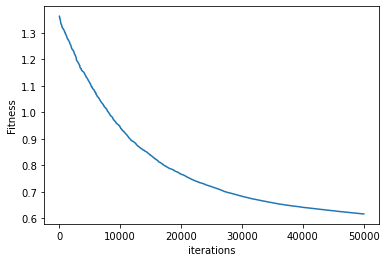

In [34]:
plt.plot(rhc_nn.fitness_curve * -1)
plt.xlabel('iterations')
plt.ylabel('Fitness')

In [36]:
gd_nn = mlrose.NeuralNetwork(hidden_nodes=[16, 16], activation='relu',
                          algorithm='gradient_descent', max_iters=1000,
                          bias=True, is_classifier=True, learning_rate=0.001,
                          early_stopping=False, clip_max=1e10,
                          max_attempts=1000, random_state=10, curve=True)

In [37]:
gd_nn.fit(x_train, y_train)

NeuralNetwork(hidden_nodes=[16, 16], learning_rate=0.001, max_iters=1000)

In [38]:
print('GD training classification report = \n {}'.format(classification_report(y_train, gd_nn.predict(x_train))))

GD training classification report = 
               precision    recall  f1-score   support

           0       0.86      0.77      0.81      3956
           1       0.77      0.85      0.81      3522

    accuracy                           0.81      7478
   macro avg       0.81      0.81      0.81      7478
weighted avg       0.81      0.81      0.81      7478



In [39]:
print('GD test classification report = \n {}'.format(classification_report(y_test, gd_nn.predict(x_test))))

GD test classification report = 
               precision    recall  f1-score   support

           0       0.86      0.76      0.81      1917
           1       0.77      0.87      0.82      1767

    accuracy                           0.81      3684
   macro avg       0.82      0.81      0.81      3684
weighted avg       0.82      0.81      0.81      3684



Text(0, 0.5, 'Fitness')

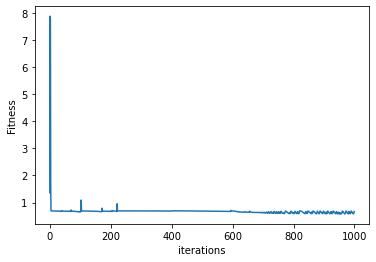

In [40]:
plt.plot(gd_nn.fitness_curve * -1)
plt.xlabel('iterations')
plt.ylabel('Fitness')

In [7]:
ga_nn = mlrose.NeuralNetwork(hidden_nodes=[16, 16], activation='relu',
                          algorithm='genetic_alg', max_iters=100,
                          bias=True, is_classifier=True, learning_rate=0.01,
                          early_stopping=False, clip_max=1e10,
                          pop_size = 1000,
                          max_attempts=20, random_state=10, curve=True)

In [8]:
ga_nn.fit(x_train, y_train)

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: Runtim

NeuralNetwork(hidden_nodes=[16, 16], learning_rate=0.01, pop_size=1000)

In [9]:
print('GA training classification report = \n {}'.format(classification_report(y_train, ga_nn.predict(x_train))))

GA training classification report = 
               precision    recall  f1-score   support

           0       0.64      0.70      0.67      3956
           1       0.62      0.55      0.59      3522

    accuracy                           0.63      7478
   macro avg       0.63      0.63      0.63      7478
weighted avg       0.63      0.63      0.63      7478



/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))


In [10]:
print('GA test classification report = \n {}'.format(classification_report(y_test, ga_nn.predict(x_test))))

GA test classification report = 
               precision    recall  f1-score   support

           0       0.63      0.72      0.67      1917
           1       0.64      0.54      0.58      1767

    accuracy                           0.63      3684
   macro avg       0.63      0.63      0.63      3684
weighted avg       0.63      0.63      0.63      3684



/Users/yaoxiao/opt/anaconda3/lib/python3.8/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))


Text(0, 0.5, 'Fitness')

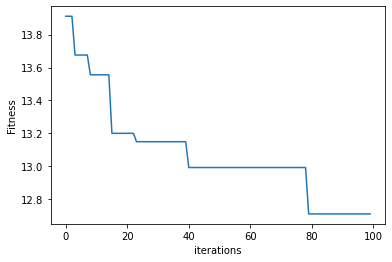

In [11]:
plt.plot(ga_nn.fitness_curve * -1)
plt.xlabel('iterations')
plt.ylabel('Fitness')